<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"></ul></div>

In [1]:
import numpy as np, matplotlib.pyplot as plt, matplotlib as mpl
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import seaborn as sns
import pcmdpy as ppy
from astropy.io import fits
%matplotlib inline

GPU acceleration not available, sorry
No module named 'pycuda'


In [5]:
hdu = fits.open('../data/h_m51_b_s05_drz_weight.fits')[0]

In [36]:
image_I = fits.open('../data/h_m51_i_s05_drz_sci.fits')[0].data
weights_I = fits.open('../data/h_m51_i_s05_drz_weight.fits')[0].data
image_V = fits.open('../data/h_m51_v_s05_drz_sci.fits')[0].data
weights_V = fits.open('../data/h_m51_v_s05_drz_weight.fits')[0].data
image_B = fits.open('../data/h_m51_b_s05_drz_sci.fits')[0].data
weights_B = fits.open('../data/h_m51_b_s05_drz_weight.fits')[0].data

In [4]:
f = [ppy.instrument.ACS_WFC_F814W(), ppy.instrument.ACS_WFC_F555W()]

In [5]:
flux_I = image_I * weights_I
flux_V = image_V * weights_V
flux_B = image_B * weights_B

NameError: name 'image_I' is not defined

In [40]:
image = np.array([flux_I, flux_V, flux_B])

In [53]:
bools['arm2'].shape

(12200, 8600)

In [59]:
mags_manual = [filt.counts_to_mag(im) for filt, im in zip(f, image[:,bools['arm2']])]

In [61]:
pcmd_manual = ppy.utils.make_pcmd(mags_manual)

(27.362459182739258, 24)

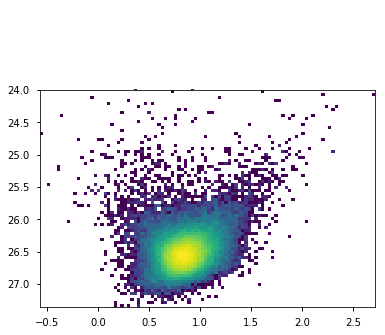

In [66]:
ax, _, _, _ = ppy.plotting.plot_pcmd(pcmd_manual);
ax.set_ylim(ymax=24)

(27.197773, 24)

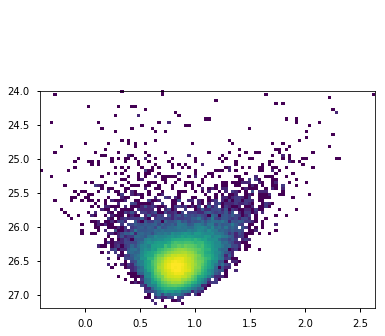

In [67]:
pcmd_data = np.loadtxt('../data/m51_arm2_I-VI-BV.dat', unpack=True)
ax, _, _, _ = ppy.plotting.plot_pcmd(pcmd_data[:2])
ax.set_ylim(ymax=24)

In [47]:
image[:,::10, ::10].shape

(3, 1220, 860)

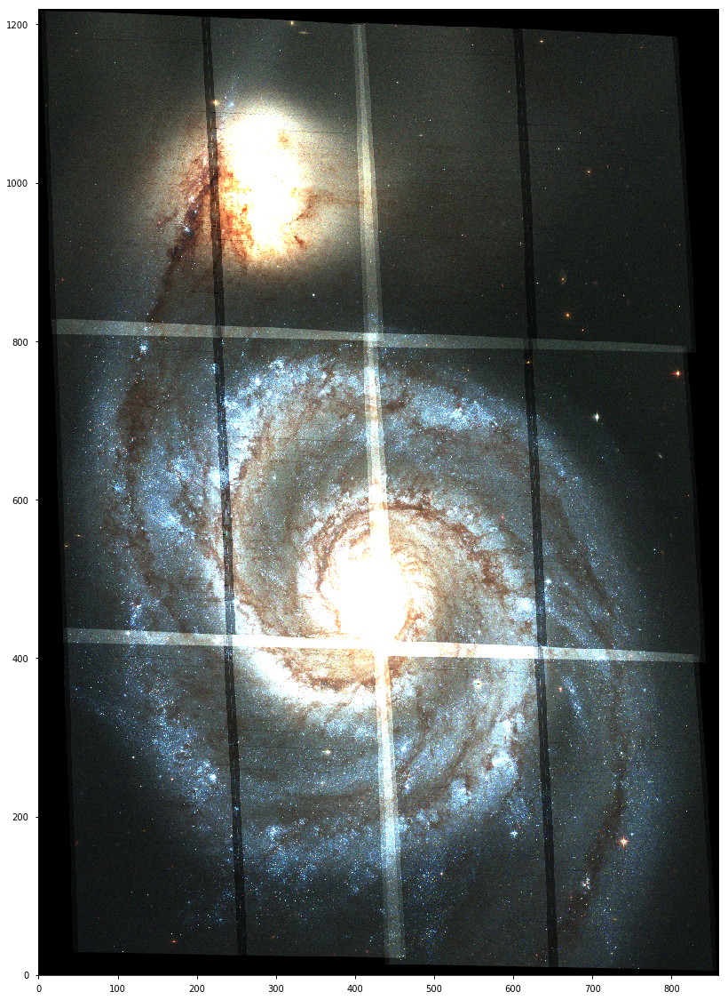

In [49]:
fig, ax = plt.subplots(figsize=(15, 20))
ppy.plotting.plot_rgb_image(image[:,::10,::10], clip_percent=95, ax=ax)

In [7]:
hdu.header

SIMPLE  =                    T / Fits standard                                  
BITPIX  =                  -32 / Bits per pixel                                 
NAXIS   =                    2 / Number of axes                                 
NAXIS1  =                 8600 / Axis length                                    
NAXIS2  =                12200 / Axis length                                    
EXTEND  =                    T / File may contain extensions                    
OBJECT  = 'Whirlpool Galaxy M51 in B' / Name of the object observed             
ORIGIN  = 'NOAO-IRAF FITS Image Kernel July 2003' / FITS file originator        
IRAF-TLM= '10:47:57 (20/04/2005)' / Time of last modification                   
NEXTEND =                    0 / Number of standard extensions                  
DATE    = '2005-04-18T16:09:14' / date this file was written (yyyy-mm-dd)       
FILENAME= 'h_m51_b_s05_drz_weight.fits' / name of file                          
FILETYPE= 'SCI      '       

In [9]:
sns.set_context('notebook')

In [7]:
files = ['../data/h_m51_i_s05_drz_sci.fits', '../data/h_m51_v_s05_drz_sci.fits', '../data/h_m51_b_s05_drz_sci.fits']
filts = ppy.instrument.m51_filter_sets
m51 = ppy.utils.DataSet(files, filts)
for f in m51.filters:
    f._exposure /= 24.  # Exposure is miscalculated in FITS files

In [8]:
f = m51.filters
dmod_m51 = 25. + 5.*np.log10(8.58)

In [9]:
def read_region(ds9_line):
    try:
        data, comments = ds9_line.split(' #')
    except ValueError:
        return None, None, None
    if not data.startswith('box'):
        return None, None, None
    x, y, dx, dy, _ = [float(s) for s in data.lstrip('box(').rstrip(')').split(',')]
    xlim = [int(x-dx/2), int(x+dx/2)]
    ylim = [int(y-dy/2), int(y+dy/2)]
    if 'text=' in comments:
        name = comments.split('text={')[-1].split('}')[0]
    else:
        name = ''
    return xlim, ylim, name

In [10]:
regions = {}
with open('../data/m51_regions_detector.reg', 'r') as my_file:
    lines = my_file.readlines()
    for line in lines:
        xlim, ylim, name = read_region(line)
        if name is not None:
            regions[name.lower()] = (xlim, ylim)

In [11]:
regions.keys()

dict_keys(['gap', 'arm2', 'bulge', 'm51b', 'arm'])

In [12]:
def add_region(xlim, ylim, ax, title=None, **kwargs):
    dx = np.diff(xlim)[0]
    dy = np.diff(ylim)[0]
    kwargs['color'] = kwargs.get('color', 'r')
    kwargs['lw'] = kwargs.get('lw', 2)
    kwargs['fill'] = kwargs.get('fill', False)
    r = ax.add_patch(mpl.patches.Rectangle((xlim[0], ylim[0]), dx, dy, **kwargs))
    if title is not None:
        ax.text(xlim[0], ylim[1]+0.1*dy, title, color=kwargs['color'],
                verticalalignment='bottom', horizontalalignment='left', fontsize=16)
    return r

In [13]:
I_sky = f[0].counts_to_mag(82./4.)

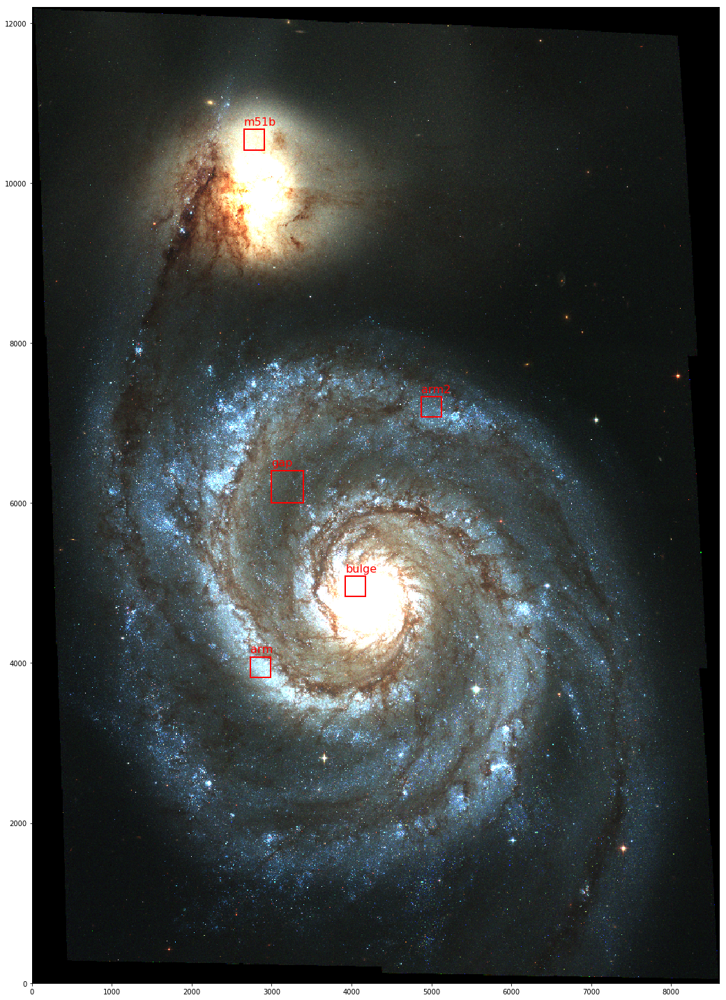

In [14]:
fig, ax = plt.subplots(figsize=(15, 20))
im_full, extent = m51.get_image(downsample=10)
_ = ppy.plotting.plot_rgb_image(im_full, extent=extent, ax=ax)
for r, (xlim, ylim) in regions.items():
    add_region(xlim, ylim, ax, title=r)
plt.tight_layout()
# plt.savefig('figures/M51_with_regions.pdf')
plt.savefig('figures/M51_with_regions.jpg')

In [15]:
def full_clip(percentile):
    return np.array([np.percentile(im_full[:,:,i], percentile) for i in range(3)])

In [16]:
try:
    ppy.gpu_utils.initialize_gpu(n=0)
    GPU_AVAIL = True
except:
    GPU_AVAIL = False

In [20]:
iso_model = ppy.isochrones.Isochrone_Model(f, dm_interp=0.15)
driv = ppy.driver.Driver(iso_model, gpu=GPU_AVAIL)

starting manual interpolation
done with interpolation


In [17]:
X, Y = np.meshgrid(np.arange(m51.im_shape[1]), np.arange(m51.im_shape[0]))

def make_bools(xlim, ylim):
    return (xlim[0] <= X) & (X < xlim[1]) & (ylim[0] <= Y) & (Y < ylim[1])

In [18]:
bools = {}
for k, (xlim, ylim) in regions.items():
    bools[k] = make_bools(xlim, ylim)

In [19]:
def showcase_region(xlim, ylim, mag_noise=I_sky, title=None):
    fig = plt.figure(figsize=(16, 15))
    gs0 = gridspec.GridSpec(3,3, figure=fig)
    ax1 = plt.subplot(gs0[:,1:])
    ax1.set_yticks([])
    ax1.set_xticks([])
    ax2 = plt.subplot(gs0[0,0])
    ax2.yaxis.get_major_locator().set_params(nbins=2)
    ax2.xaxis.get_major_locator().set_params(nbins=2)
    ax3 = plt.subplot(gs0[1,0])
    ax4 = plt.subplot(gs0[2,0])

    b = make_bools(xlim, ylim)
    im, ext = m51.get_image(b)
    pcmd = m51.get_pcmd(b)

    ax1 = ppy.plotting.plot_rgb_image(im_full, extent=(0, im_full.shape[1]*10, 0, im_full.shape[0]*10), ax=ax1, clip_vals=full_clip(99.))
    x1, x2 = xlim
    y1, y2 = ylim
    ax2 = ppy.plotting.plot_rgb_image(im, ax=ax2, clip_vals=full_clip(99.), extent=(x1, x2, y1, y2))
    mark_inset(ax1, ax2, loc1=1, loc2=3, ec='r', lw=1)
    ppy.plotting.plot_pcmd(pcmd[:2], bins=100, ax=ax3)
    ppy.plotting.plot_pcmd(pcmd[::2], bins=100, ax=ax4)
    ppy.plotting.plot_isochrone(iso_model, dmod=dmod_m51, axes=[ax3, ax4], zorder=-1)
    for a in [ax3, ax4]:
        a.set_ylim([29., 22.])
        a.axhline(y=mag_noise, ls='--', color='r')
    if title is not None:
        ax2.set_title(title, fontsize=24)
    plt.tight_layout()

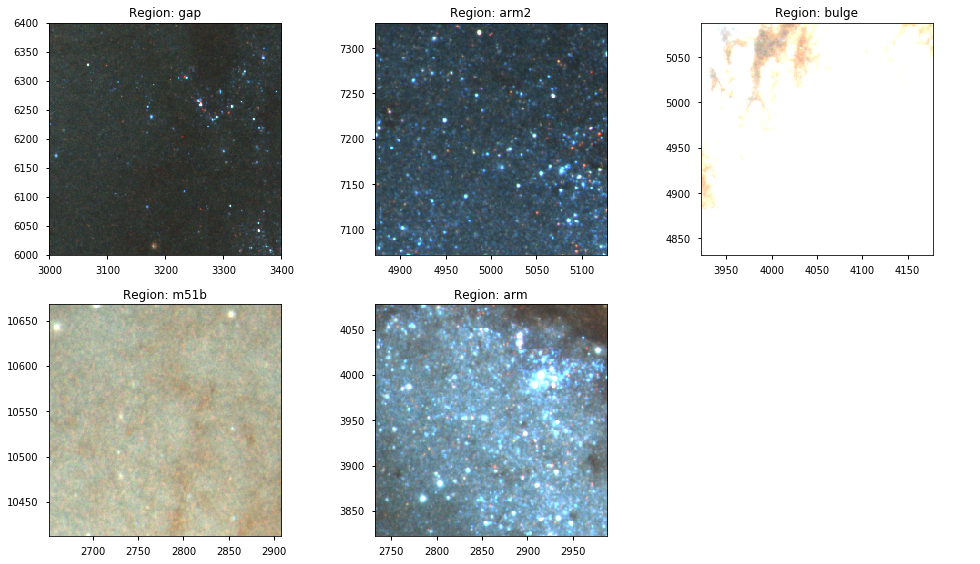

In [28]:
ims = {}
fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(14, 8))
for k, ax in zip(bools.keys(), axes.flatten()):
    ims[k], extent = m51.get_image(bools[k], downsample=1)
    ax = ppy.plotting.plot_rgb_image(ims[k], extent=extent, ax=ax, clip_vals=full_clip(99.))
    ax.set_title('Region: {:s}'.format(k))
axes[1,2].axis('off')
plt.tight_layout()

In [29]:
pcmds = {}
for k, b in bools.items():
    pcmds[k] = m51.get_pcmd(b)

In [30]:
def save_pcmd(name):
    xlim, ylim = regions[name]
    pcmd_data = pcmds[name]
    base_info = 'Vega Mags\n{:s} region extracted from square X=[{:d},{:d}), Y=[{:d}, {:d}) from M51 image'.format(name, int(xlim[0]), int(xlim[1]), int(ylim[0]), int(ylim[1]))
    filename = '../data/test4x_m51_{:s}_I-VI-BV.dat'.format(name)
    np.savetxt(filename, pcmd_data.T, fmt='%.6f', header=base_info+'\nImag Vmag-Imag Bmag-Vmag\nF814W F555W-F814W F435W-F555W')
    print('saved to: {:s}'.format(filename))

In [31]:
for name in pcmds.keys():
    save_pcmd(name)

saved to: ../data/test4x_m51_gap_I-VI-BV.dat
saved to: ../data/test4x_m51_arm2_I-VI-BV.dat
saved to: ../data/test4x_m51_bulge_I-VI-BV.dat
saved to: ../data/test4x_m51_m51b_I-VI-BV.dat
saved to: ../data/test4x_m51_arm_I-VI-BV.dat


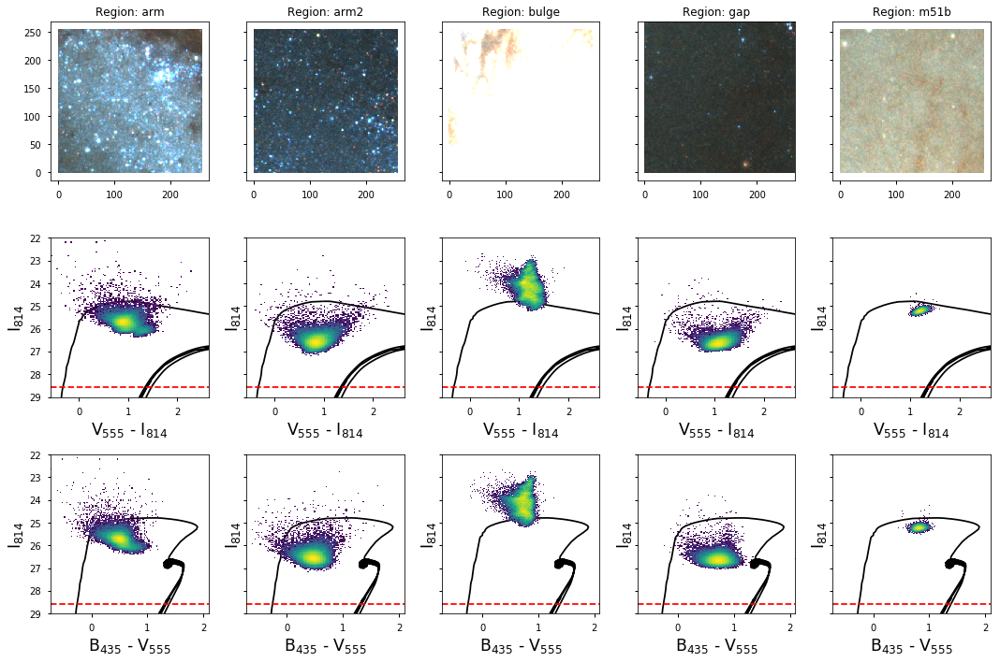

In [32]:
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 10), sharex='row', sharey='row')
for i, k in enumerate(sorted(pcmds.keys())):
    ppy.plotting.plot_rgb_image(ims[k], ax=axes[0,i], clip_vals=full_clip(99.))
    ppy.plotting.plot_pcmd(pcmds[k][:2], bins=100, ax=axes[1,i])
    ppy.plotting.plot_pcmd(pcmds[k][::2], bins=100, ax=axes[2,i])
    ppy.plotting.plot_isochrone(iso_model, dmod=dmod_m51, axes=axes[1:, i], zorder=-1)
    axes[0,i].set_title('Region: {:s}'.format(k))
    axes[1,i].axhline(y=I_sky, ls='--', color='r')
    axes[2,i].axhline(y=I_sky, ls='--', color='r')
axes[1,0].set_ylim([29, 22]), axes[2,0].set_ylim([29, 22])
plt.tight_layout()
plt.savefig('figures/m51_regions.pdf')

In [21]:
k = 'gap'
showcase_region(regions[k][0], regions[k][1])

TypeError: __init__() got an unexpected keyword argument 'figure'

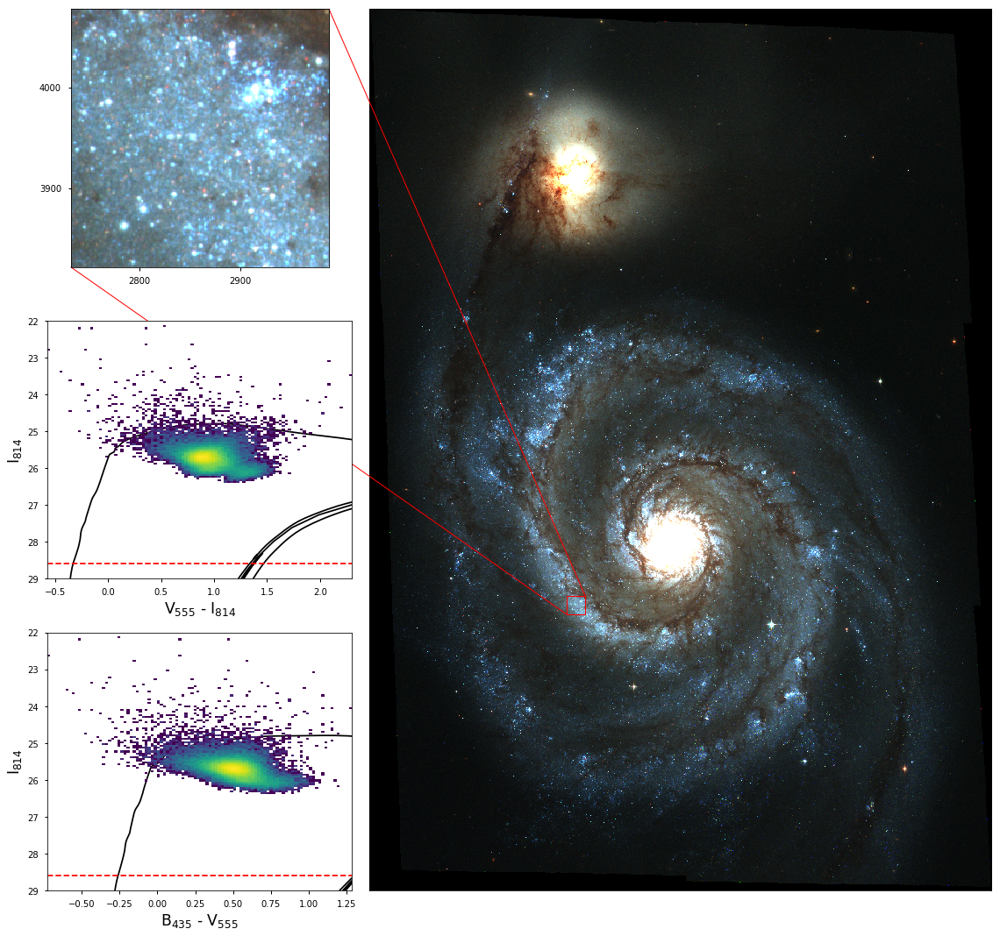

In [23]:
k = 'arm'
showcase_region(regions[k][0], regions[k][1])

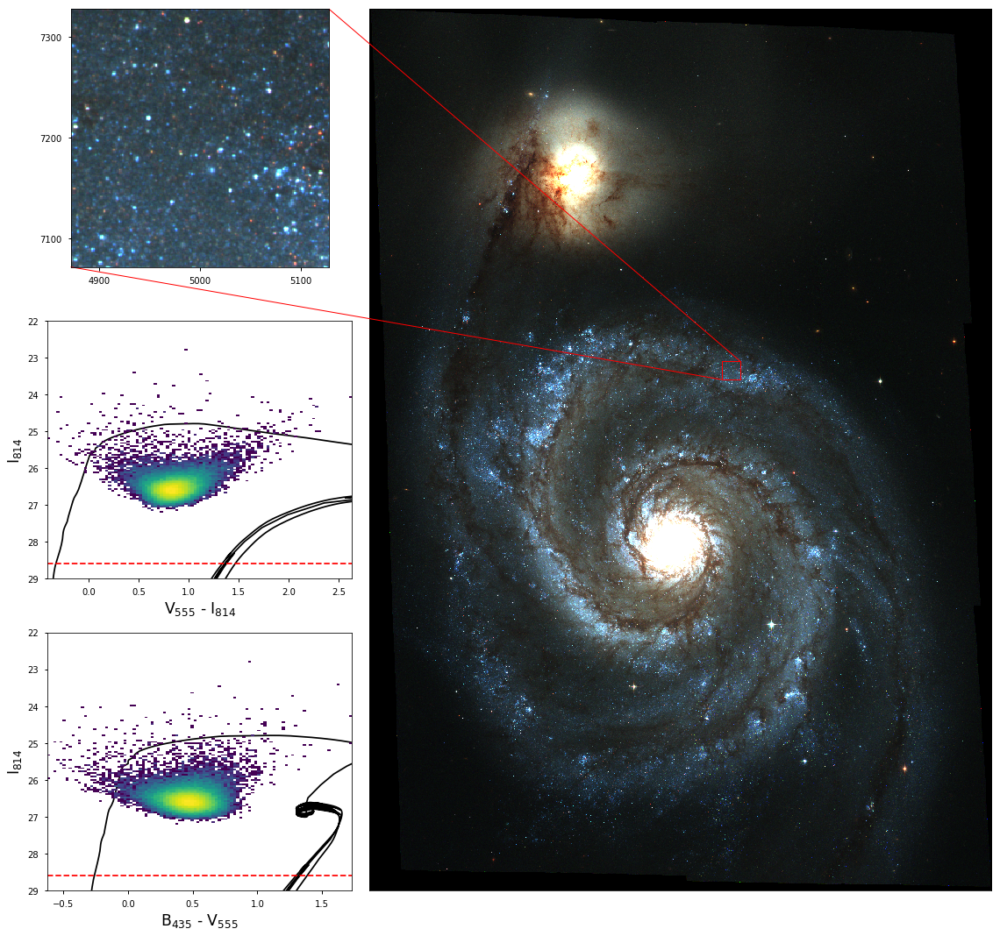

In [24]:
k = 'arm-2'
showcase_region(regions[k][0], regions[k][1])

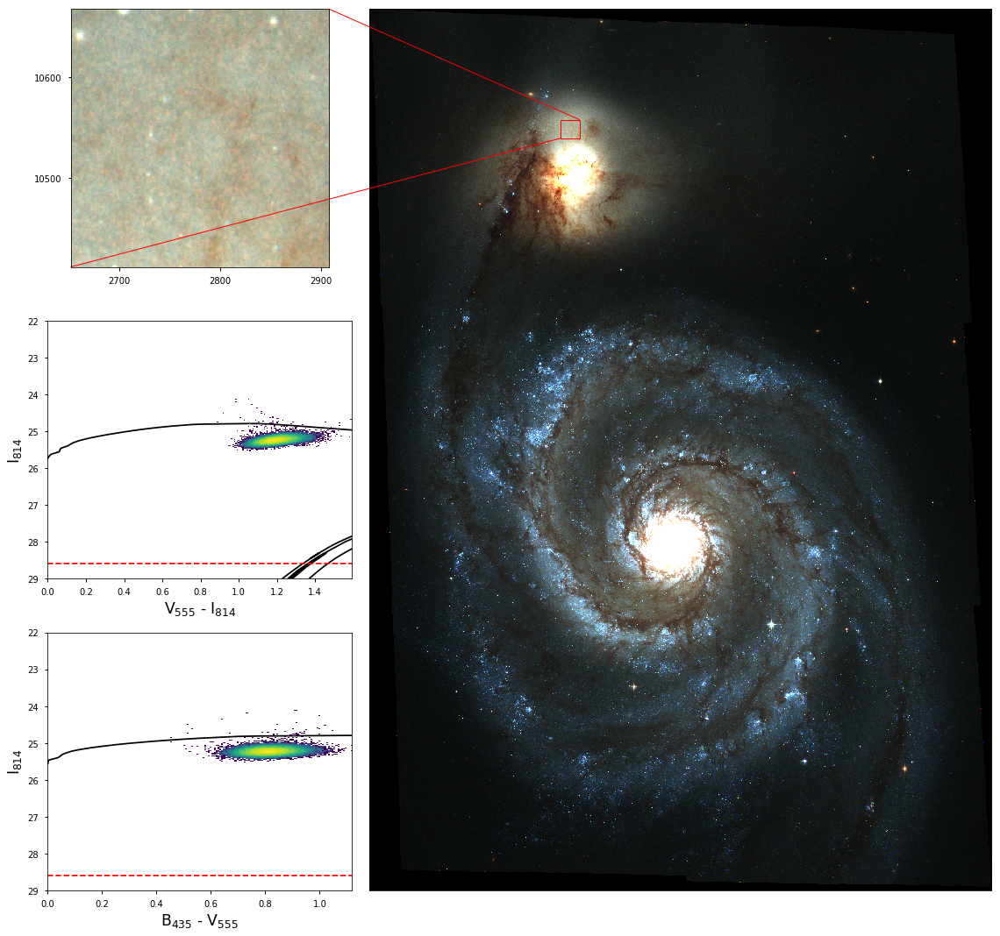

In [25]:
k = 'm51b'
showcase_region(regions[k][0], regions[k][1])

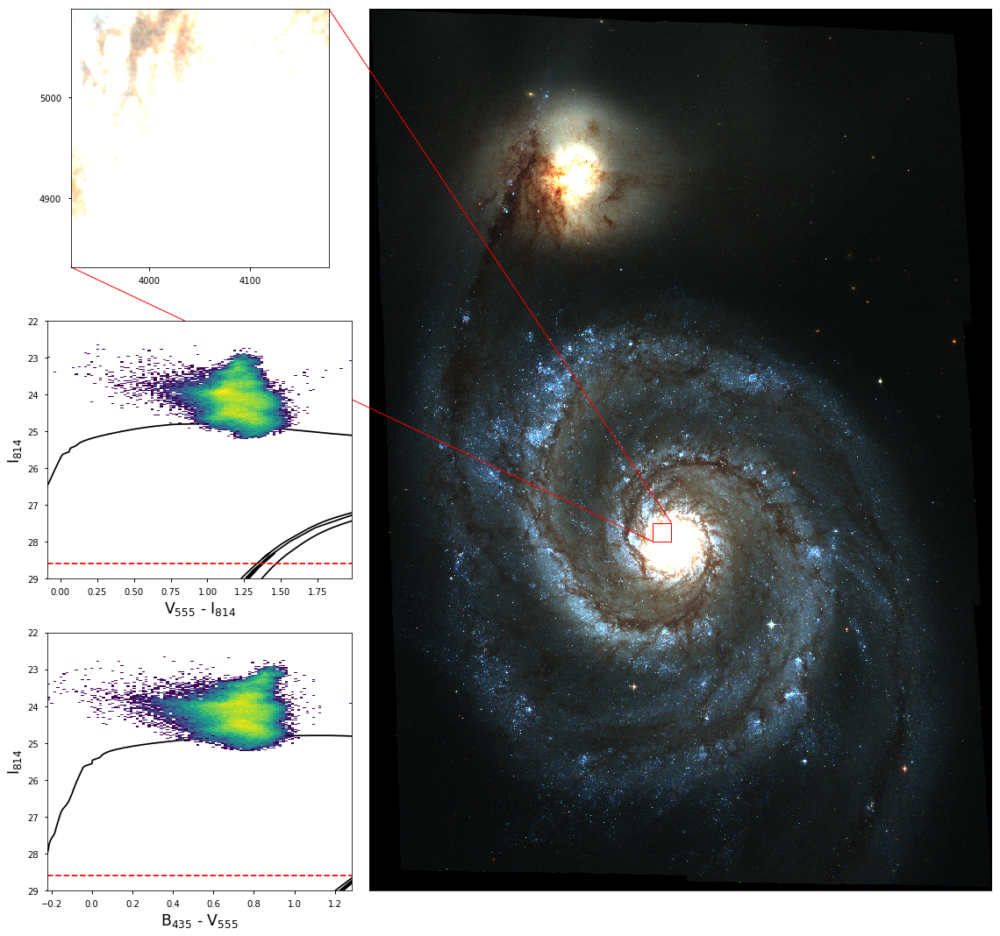

In [26]:
k = 'bulge'
showcase_region(regions[k][0], regions[k][1])

In [109]:
gal = ppy.galaxy.CustomGalaxy(ppy.metalmodels.SingleFeH(), ppy.dustmodels.SingleDust(), ppy.agemodels.TauModel(),
                             ppy.distancemodels.FixedDistance(dmod=dmod_m51), np.array([0., -10., 0., 100.]))

In [125]:
def estimate_Npix(im, tau, norm_by_mass=True):
    num_pix = im.shape[0] * im.shape[1]
    flux_sky = num_pix * np.array([82, 41, 55])
    flux = im.sum(axis=0).sum(axis=0) - flux_sky
    gal.set_params(np.array([0., -10., 0., tau]))
    imf, mags = iso_model.model_galaxy(gal, norm_by_mass=norm_by_mass)
    fluxes = np.array([f_.mag_to_counts(m) for f_, m in zip(f, mags)])
    flux_model = (imf * fluxes).sum(axis=-1)
    N_stars = flux / flux_model
    return N_stars / num_pix

In [143]:
taus = np.logspace(-1, 2, 100)

In [144]:
from tqdm import tqdm_notebook as tqdm

In [148]:
Npix_I, Npix_V, Npix_B = [], [], []
Npix_I_c, Npix_V_c, Npix_B_c = [], [], []
for t in tqdm(taus):
    a, b, c = estimate_Npix(ims['gap'], t)
    Npix_I += [a]
    Npix_V += [b]
    Npix_B += [c]
    a, b, c = estimate_Npix(ims['gap'], t, norm_by_mass=False)
    Npix_I_c += [a]
    Npix_V_c += [b]
    Npix_B_c += [c]

HBox(children=(IntProgress(value=0), HTML(value='')))

Text(0.5,1,'Gap')

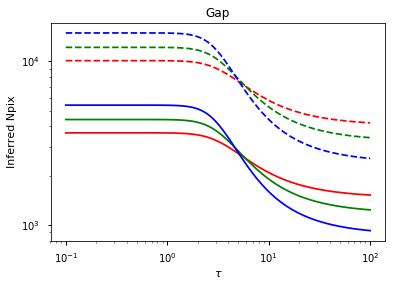

In [152]:
plt.plot(taus, Npix_I, 'r-')
plt.plot(taus, Npix_V, 'g-')
plt.plot(taus, Npix_B, 'b-')
plt.plot(taus, Npix_I_c, 'r--')
plt.plot(taus, Npix_V_c, 'g--')
plt.plot(taus, Npix_B_c, 'b--')
plt.xlabel(r'$\tau$'), plt.xscale('log')
plt.ylabel('Inferred Npix'), plt.yscale('log')
plt.title('Gap')

In [153]:
Npix_I, Npix_V, Npix_B = [], [], []
Npix_I_c, Npix_V_c, Npix_B_c = [], [], []
for t in tqdm(taus):
    a, b, c = estimate_Npix(ims['arm'], t)
    Npix_I += [a]
    Npix_V += [b]
    Npix_B += [c]
    a, b, c = estimate_Npix(ims['arm'], t, norm_by_mass=False)
    Npix_I_c += [a]
    Npix_V_c += [b]
    Npix_B_c += [c]

HBox(children=(IntProgress(value=0), HTML(value='')))

Text(0.5,1,'Arm')

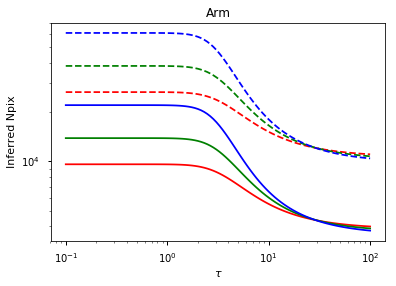

In [154]:
plt.plot(taus, Npix_I, 'r-')
plt.plot(taus, Npix_V, 'g-')
plt.plot(taus, Npix_B, 'b-')
plt.plot(taus, Npix_I_c, 'r--')
plt.plot(taus, Npix_V_c, 'g--')
plt.plot(taus, Npix_B_c, 'b--')
plt.xlabel(r'$\tau$'), plt.xscale('log')
plt.ylabel('Inferred Npix'), plt.yscale('log')
plt.title('Arm')